In [120]:
!pip install -Uqq fastbook
import fastbook
import os
fastbook.setup_book()

In [121]:
from fastbook import *
from fastai.vision.widgets import *

In [122]:
key = os.environ.get('AZURE_SEARCH_KEY','5c5723ca27ce409c86169428500f0978')

In [123]:
search_images_bing

<function fastbook.search_images_bing>

In [136]:
results = search_images_bing(key, 'nike shoes')
ims = results.attrgot('content_url')
len(ims)

150

In [137]:
ims = ['https://cdna.lystit.com/photos/zappos/904aedad/nike-University-RedTeam-RedWhite-Tanjun-wolf-Greywhite-Mens-Running-Shoes.jpeg']

In [138]:
dest = 'images/nike.jpg'
doc(download_url)
os.mkdir('images')
download_url(ims[0], dest)

FileExistsError: ignored

In [139]:
im = Image.open(dest)
im.to_thumb(128,128)

FileNotFoundError: ignored

In [140]:
brand_types = 'nike','adidas','reebok'
path = Path('shoes')

In [148]:
for o in brand_types:
      dest = (path/o)
      dest.mkdir(exist_ok=True)
      results = search_images_bing(key, f'{o} shoes')
      download_images(dest, urls=results.attrgot('contentUrl'))

results

(#150) [{'webSearchUrl': 'https://www.bing.com/images/search?view=detailv2&FORM=OIIRPO&q=reebok+shoes&id=4AE93AA136819851380310B08AAF21E764E8A8B4&simid=607995618232568368', 'name': 'REEBOK Running Shoes & Sports Shoes', 'thumbnailUrl': 'https://tse1.mm.bing.net/th?id=OIP.A-C3okvo_wsCAQpVWfhelAHaHa&pid=Api', 'datePublished': '2020-03-19T03:03:00.0000000Z', 'isFamilyFriendly': True, 'contentUrl': 'http://www.stylesglamour.com/wp-content/uploads/2015/01/Reebok-running-shoes-and-sportsshoes-for-women-26.jpg', 'hostPageUrl': 'http://www.stylesglamour.com/reebok-running-shoes-and-sports-shoes/', 'contentSize': '421428 B', 'encodingFormat': 'jpeg', 'hostPageDisplayUrl': 'www.stylesglamour.com/reebok-running-shoes-and-sports-shoes', 'width': 2000, 'height': 2000, 'hostPageDiscoveredDate': '2016-08-09T00:00:00.0000000Z', 'thumbnail': {'width': 474, 'height': 474}, 'imageInsightsToken': 'ccid_A+C3okvo*cp_B88C4401BC13D1A13A59DE4A1DB87B4B*mid_4AE93AA136819851380310B08AAF21E764E8A8B4*simid_60799561

In [149]:
fns = get_image_files(path)
fns

(#419) [Path('shoes/nike/00000033.jpg'),Path('shoes/nike/00000105.jpg'),Path('shoes/nike/00000029.jpg'),Path('shoes/nike/00000145.JPG'),Path('shoes/nike/00000097.jpg'),Path('shoes/nike/00000108.jpg'),Path('shoes/nike/00000067.jpg'),Path('shoes/nike/00000142.jpg'),Path('shoes/nike/00000089.jpg'),Path('shoes/nike/00000140.png')...]

In [150]:
failed = verify_images(fns)
failed

(#12) [Path('shoes/nike/00000067.jpg'),Path('shoes/nike/00000013.jpg'),Path('shoes/nike/00000052.jpg'),Path('shoes/nike/00000043.jpg'),Path('shoes/nike/00000006.jpg'),Path('shoes/adidas/00000005.jpg'),Path('shoes/adidas/00000068.jpg'),Path('shoes/adidas/00000117.jpg'),Path('shoes/adidas/00000092.jpg'),Path('shoes/adidas/00000082.jpg')...]

In [151]:
failed.map(Path.unlink)

(#12) [None,None,None,None,None,None,None,None,None,None...]

In [153]:
failed.map(Path.unlink);

FileNotFoundError: ignored

In [154]:
shoes = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [155]:
dls = shoes.dataloaders(path)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


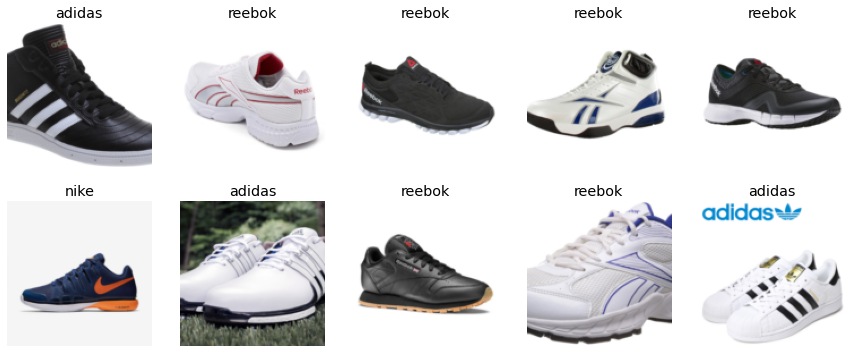

In [156]:
dls.valid.show_batch(max_n=10, nrows=2)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


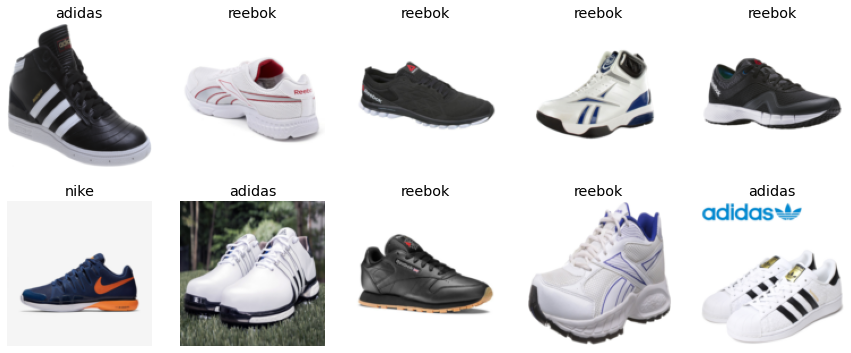

In [157]:
shoes = shoes.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = shoes.dataloaders(path)
dls.valid.show_batch(max_n=10, nrows=2)

In [158]:
shoes = shoes.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = shoes.dataloaders(path)
dls

In [159]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.802524,1.081219,0.493827,01:26


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,1.115273,0.779279,0.358025,01:50
1,1.052190,0.688177,0.296296,01:50
2,0.849157,0.636250,0.246914,01:50
3,0.767009,0.646615,0.234568,01:50


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


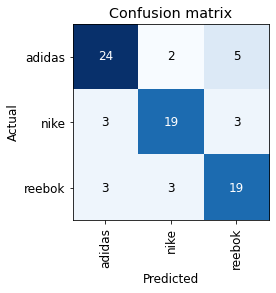

In [160]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

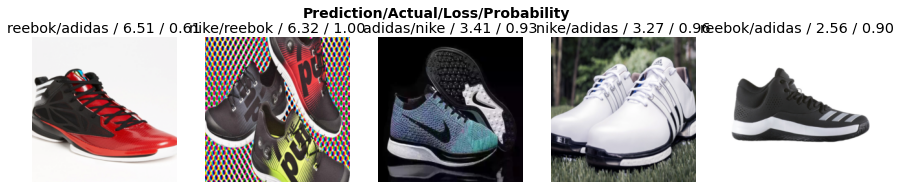

In [161]:
interp.plot_top_losses(5, nrows=1)

In [162]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [178]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/trash)

In [180]:
learn.export()

In [181]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [182]:
learn_inf = load_learner(path/'export.pkl')

In [183]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [184]:
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [185]:
img = PILImage.create(btn_upload.data[-1])

In [186]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [187]:
pred,pred_idx,probs = learn_inf.predict(img)

In [188]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred.value = 'Please choose an image'
lbl_pred

Label(value='Please choose an image')

In [189]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [190]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [191]:
btn_upload = widgets.FileUpload()

In [192]:
VBox([widgets.Label('Select your shoes!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [193]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

     |████████████████████████████████| 1.9MB 6.5MB/s 
     |████████████████████████████████| 194kB 44.0MB/s 
     |████████████████████████████████| 112kB 32.6MB/s 
     |████████████████████████████████| 552kB 19.3MB/s 
     |████████████████████████████████| 71kB 7.1MB/s 
     |████████████████████████████████| 430kB 44.3MB/s 
     |████████████████████████████████| 102kB 11.0MB/s 
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7667 sha256=02d81547bd6bc4eb0ec993534513efa807a82499e5ee0f7fe7efec22e6bde7e5
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
Successfully built contextvars
ERROR: nbdev 1.1.12 has requirement nbconvert<6, but you'll have nbconvert 6.0.7 which is incompatible.
ERROR: google-colab 1.0.0 has requirement tornado~=5.1.0; python_version >= "3.0", but you'll have tornado 6.1 which is incompatible.
  Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:


Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
